In [22]:
import os

N_THREADS = "4"
os.environ["OMP_NUM_THREADS"] = N_THREADS
os.environ["OPENBLAS_NUM_THREADS"] = N_THREADS
os.environ["MKL_NUM_THREADS"] = N_THREADS
os.environ["VECLIB_MAXIMUM_THREADS"] = N_THREADS
os.environ["NUMEXPR_NUM_THREADS"] = N_THREADS

import gEconpy as ge
import numpy as np
import pandas as pd
import gEconpy.plotting as gp
import matplotlib.pyplot as plt
import arviz as az
from corner import corner

import pymc as pm
from pymc.model.transform.optimization import freeze_dims_and_data

import preliz as pz
import nutpie as ntp

In [30]:
gcn_file = "../GCN Files/sims_2024/nk_complete_taxes.gcn"
mod = ge.model_from_gcn(gcn_file)

Model Building Complete.
Found:
	33 equations
	33 variables
		The following variables were eliminated at user request:
			D_t, K_d_t, TC_t, T_t, U_t, Y_j_t
		The following "variables" were defined as constants and have been substituted away:
			B_t
	12 stochastic shocks
		 0 / 12 has a defined prior. 
	35 parameters
		 27 / 35 parameters has a defined prior. 
	0 parameters to calibrate.
Model appears well defined and ready to proceed to solving.



In [31]:
ge.check_steady_state(mod, pi_bar=1.001)

Steady state successfully found!


In [32]:
pi_bar_values = np.linspace(-0.005, 0.01, 100)
ss_pi_bar = pd.DataFrame(
    [mod.steady_state(pi_bar=1 + pi_bar, sigma=1.0) for pi_bar in pi_bar_values],
    index=pi_bar_values,
)

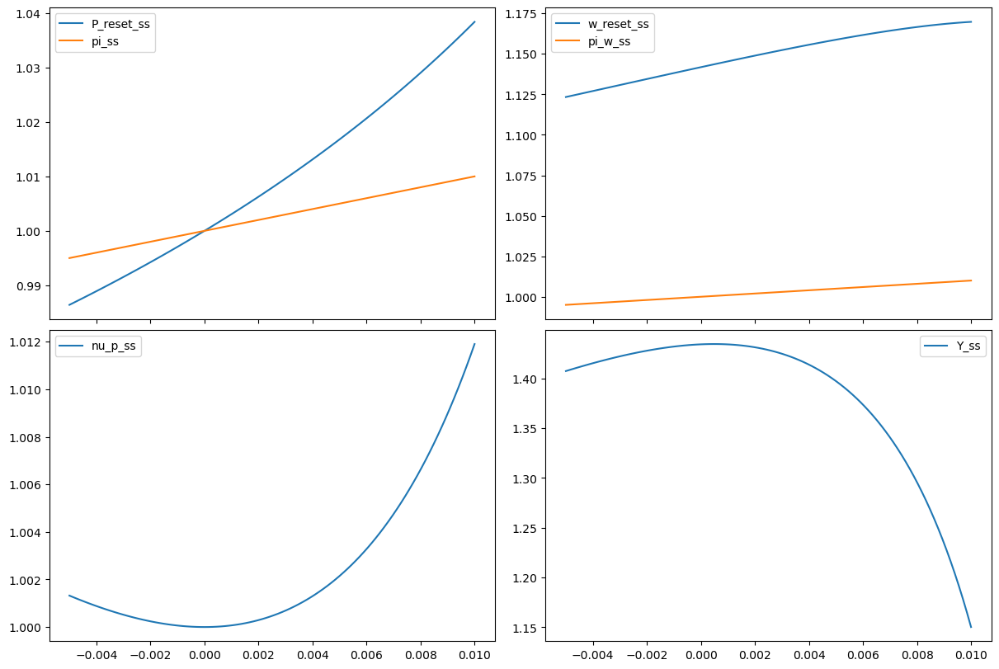

In [33]:
import matplotlib.pyplot as plt

fig, ax = plt.subplots(2, 2, figsize=(12, 8), sharex=True, layout="constrained")
variables = [["P_reset_ss", "pi_ss"], ["w_reset_ss", "pi_w_ss"], ["nu_p_ss"], ["Y_ss"]]

for var, axis in zip(variables, fig.axes):
    ss_pi_bar[var].plot(ax=axis)

plt.show()

In [51]:
irf_scenarios = {
    "consumption_tax_response": {"phi_tau_C": 1.0, "phi_tau_K": 0.0, "phi_tau_L": 0.0},
    "capital_tax_response": {"phi_tau_C": 0.0, "phi_tau_K": 1.0, "phi_tau_L": 0.0},
    "labor_tax_response": {"phi_tau_C": 0.0, "phi_tau_K": 0.0, "phi_tau_L": 1.0},
}

shock_size = {
    "epsilon_i": 0.0025,
    "epsilon_G": 0.01,
    "epsilon_A": 0.01,
    "epsilon_pi_obj": 0.001,
    "epsilon_beta": 0.01,
    "epsilon_theta": 1,
    "epsilon_I": 0.01,
    "epsilon_tau_C": 0.01,
    "epsilon_tau_L": 0.01,
    "epsilon_tau_K": 0.01,
}

In [60]:
irfs = {
    name: ge.impulse_response_function(
        mod,
        **scenario_params,
        shock_size=shock_size,
        simulation_length=20,
        not_loglin_variables=["i", "pi", "pi_obj", "tau_C", "tau_K", "tau_L"],
        verbose=False,
    ).isel(time=slice(0, None))
    for name, scenario_params in irf_scenarios.items()
}

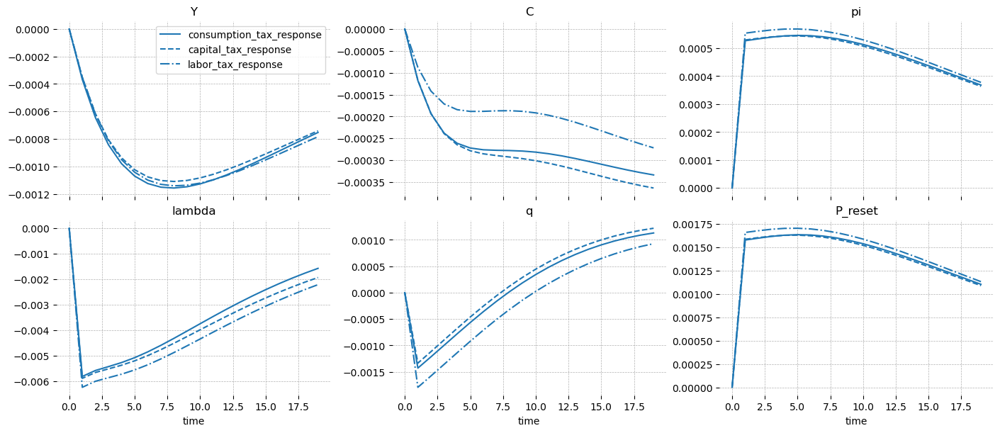

In [61]:
gp.plot_irf(
    irfs,
    vars_to_plot=["Y", "C", "pi", "lambda", "q", "P_reset"],
    shocks_to_plot=["epsilon_tau_C"],
    n_cols=3,
    figsize=(14, 6),
);

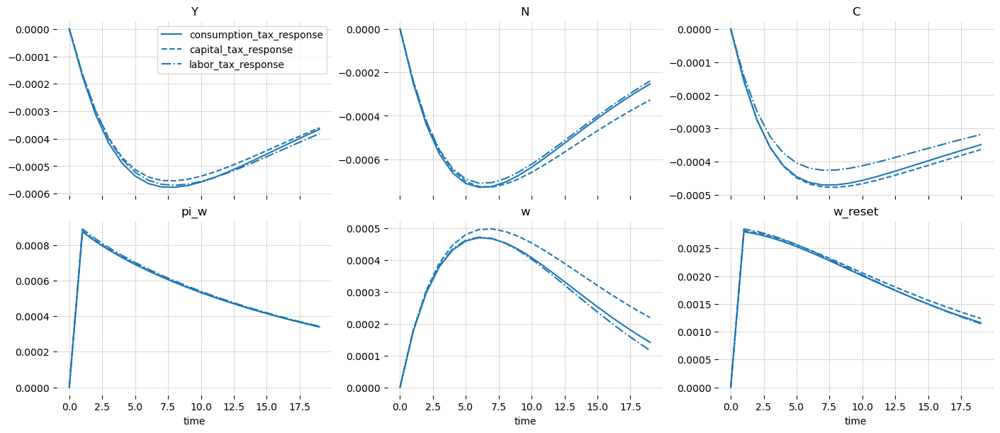

In [62]:
gp.plot_irf(
    irfs,
    vars_to_plot=["Y", "N", "C", "pi_w", "w", "w_reset"],
    shocks_to_plot=["epsilon_tau_L"],
    n_cols=3,
    figsize=(14, 6),
);

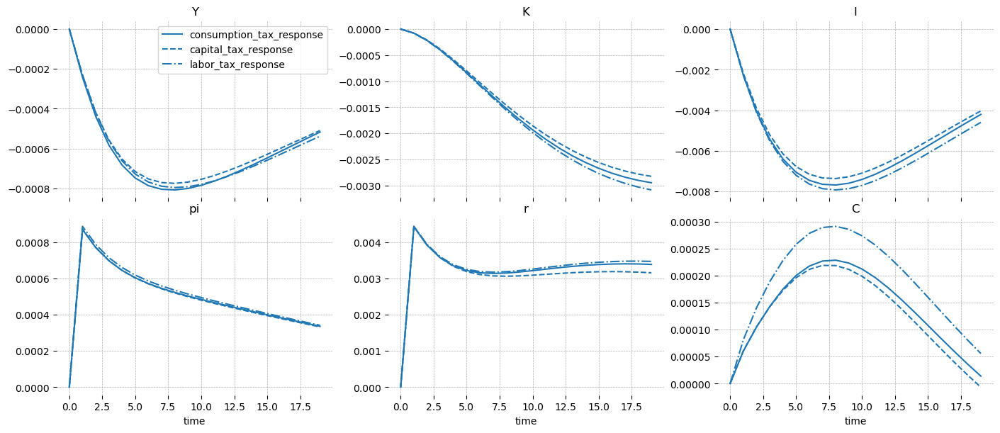

In [63]:
gp.plot_irf(
    irfs,
    vars_to_plot=["Y", "K", "I", "pi", "r", "C"],
    shocks_to_plot=["epsilon_tau_K"],
    n_cols=3,
    figsize=(14, 6),
);

In [66]:
ss_mod = ge.statespace_from_gcn(
    gcn_file, not_loglin_variables=["i", "pi", "pi_obj", "tau_C", "tau_K", "tau_L"]
)

Model Building Complete.
Found:
	33 equations
	33 variables
		The following variables were eliminated at user request:
			D_t, K_d_t, TC_t, T_t, U_t, Y_j_t
		The following "variables" were defined as constants and have been substituted away:
			B_t
	12 stochastic shocks
		 0 / 12 has a defined prior. 
	35 parameters
		 27 / 35 parameters has a defined prior. 
	0 parameters to calibrate.
Model appears well defined and ready to proceed to solving.

Statespace model construction complete, but call the .configure method to finalize.


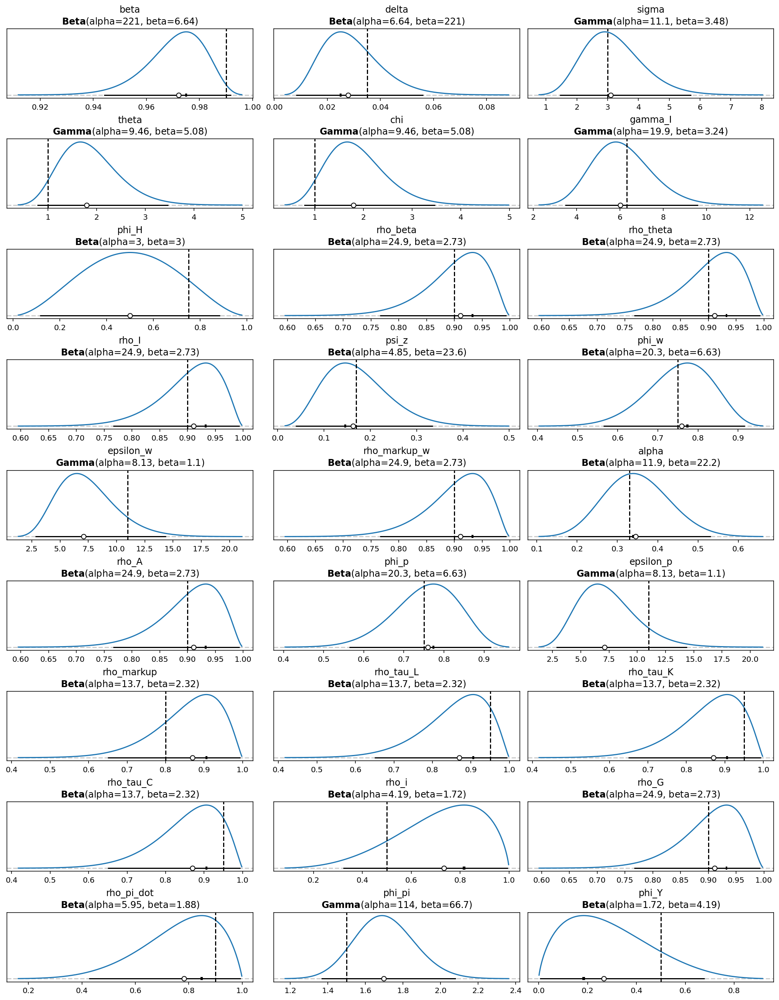

In [67]:
gp.plot_priors(ss_mod, n_cols=3);

In [82]:
ss_mod.configure(
    observed_states=[
        "Y",
        "C",
        "I",
        "K",
        "N",
        "pi",
        "pi_obj",
        "i",
        "w",
        "r",
        "tau_C",
        "tau_K",
        "tau_L",
    ],
    measurement_error=[
        "Y",
        "C",
        "I",
        "K",
        "N",
        "pi",
        "pi_obj",
        "i",
        "w",
        "r",
        "tau_C",
        "tau_K",
        "tau_L",
    ],
    constant_params=[
        "pi_bar",
        "psi",
        "tau_L",
        "tau_C",
        "tau_K",
        "phi_tau_K",
        "phi_tau_L",
        "phi_tau_C",
    ],
    full_shock_covaraince=True,
    solver="scan_cycle_reduction",
    mode="JAX",
    max_iter=20,
    use_adjoint_gradients=True,
)

The following parameters should be assigned priors inside a PyMC model block: 
	alpha -- shape: (), constraints: None, dims: None
	beta -- shape: (), constraints: None, dims: None
	chi -- shape: (), constraints: None, dims: None
	delta -- shape: (), constraints: None, dims: None
	epsilon_p -- shape: (), constraints: None, dims: None
	epsilon_w -- shape: (), constraints: None, dims: None
	gamma_I -- shape: (), constraints: None, dims: None
	phi_H -- shape: (), constraints: None, dims: None
	phi_Y -- shape: (), constraints: None, dims: None
	phi_p -- shape: (), constraints: None, dims: None
	phi_pi -- shape: (), constraints: None, dims: None
	phi_w -- shape: (), constraints: None, dims: None
	psi_z -- shape: (), constraints: None, dims: None
	rho_A -- shape: (), constraints: None, dims: None
	rho_G -- shape: (), constraints: None, dims: None
	rho_I -- shape: (), constraints: None, dims: None
	rho_beta -- shape: (), constraints: None, dims: None
	rho_i -- shape: (), constraints: None, dim

In [83]:
n_shocks = ss_mod.k_posdef

A_params = pz.maxent(pz.Gamma(), lower=0.1, upper=0.5, plot=False).params_dict
other_params = pz.maxent(pz.Gamma(), lower=0.01, upper=0.1, plot=False).params_dict

sd_dist = pm.Gamma.dist(
    alpha=[A_params["alpha"]] + [other_params["alpha"]] * (n_shocks - 1),
    beta=[A_params["beta"]] + [other_params["beta"]] * (n_shocks - 1),
)

In [84]:
import pytensor.tensor as pt

all_priors = ss_mod.param_priors | ss_mod.shock_priors

with pm.Model(coords=ss_mod.coords) as pm_mod:
    ss_mod.to_pymc()
    for var_name in ss_mod.error_states:
        x = pz.maxent(pz.Gamma(), lower=0.01, upper=0.05, plot=False)
        all_priors[f"error_sigma_{var_name}"] = x
        x.to_pymc(name=f"error_sigma_{var_name}")

    #     cov_diag = pm.Gamma('cov_diag',
    #                         alpha=[A_params['alpha']] + [other_params['alpha']] * (n_shocks - 1),
    #                         beta=[A_params['beta']] + [other_params['beta']] * (n_shocks - 1),
    #                         dims=['shock'])
    #     state_cov = pm.Deterministic('state_cov', pt.diag(cov_diag), dims=['shock', 'shock_aux'])
    chol, *_ = pm.LKJCholeskyCov(
        "state_chol", n=ss_mod.k_posdef, eta=4, sd_dist=sd_dist
    )
    cov = pm.Deterministic("state_cov", chol @ chol.T, dims=["shock", "shock_aux"])

In [85]:
date_range = pd.date_range(start="1980-01-01", end="2024-11-01", freq="QS-OCT")
true_params, data, prior_idata = ge.data_from_prior(
    ss_mod, pm_mod, index=date_range, n_samples=500, pct_missing=0
)

/Users/jessegrabowski/mambaforge/envs/geconpy-dev/lib/python3.12/site-packages/pymc_extras/statespace/utils/data_tools.py:159: ImputationWarning: Provided data contains missing values and will be automatically imputed as hidden states during Kalman filtering.
  warnings.warn(impute_message, ImputationWarning)
Sampling: [alpha, beta, chi, delta, epsilon_p, epsilon_w, error_sigma_C, error_sigma_I, error_sigma_K, error_sigma_N, error_sigma_Y, error_sigma_i, error_sigma_pi, error_sigma_pi_obj, error_sigma_r, error_sigma_tau_C, error_sigma_tau_K, error_sigma_tau_L, error_sigma_w, gamma_I, obs, phi_H, phi_Y, phi_p, phi_pi, phi_w, psi_z, rho_A, rho_G, rho_I, rho_beta, rho_i, rho_markup, rho_markup_w, rho_pi_dot, rho_tau_C, rho_tau_K, rho_tau_L, rho_theta, sigma, state_chol, theta]
Sampling: [prior_combined]


Output()

In [86]:
idx = true_params.param_idx
latent_data = (
    prior_idata.conditional_prior.prior_latent.sel(chain=0, draw=idx)
    .to_dataframe()
    .prior_latent.unstack("state")
)

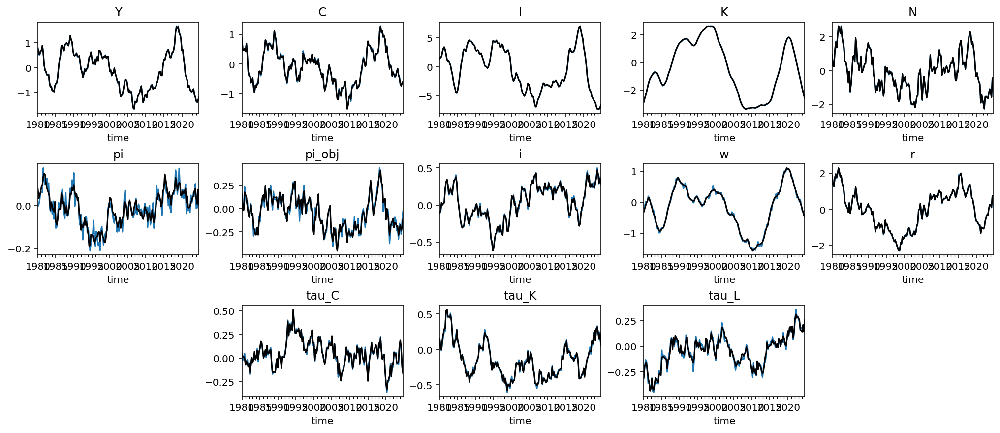

In [87]:
fig = plt.figure(figsize=(14, 6), dpi=144, layout="constrained")
gs, locs = gp.prepare_gridspec_figure(
    n_plots=len(ss_mod.observed_states), n_cols=5, figure=fig
)
for loc, col in zip(locs, data):
    axis = fig.add_subplot(gs[loc])
    data[col].plot(ax=axis, legend=False, title=col)
    latent_data[col].plot(ax=axis, legend=False, color="k")

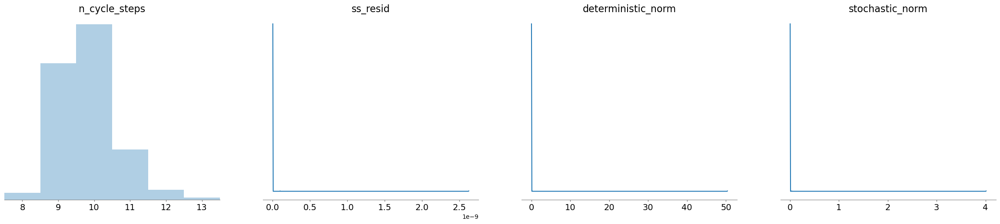

In [88]:
az.plot_posterior(
    prior_idata.prior,
    var_names=["n_cycle_steps", "ss_resid", "deterministic_norm", "stochastic_norm"],
    hdi_prob="hide",
    point_estimate=None,
);

In [125]:
ntp_mod = ntp.compile_pymc_model(
    freeze_dims_and_data(pm_mod),
    backend="jax",
    gradient_backend="jax",
    default_initialization_strategy="prior",
    jitter_rvs=set(),
    #                                  initial_points=None)
    initial_points={k: v for k, v in ss_mod.param_dict.items() if k in pm_mod},
)

/Users/jessegrabowski/mambaforge/envs/geconpy-dev/lib/python3.12/site-packages/pymc/pytensorf.py:1066: FutureWarning: compile_pymc was renamed to compile. Old name will be removed in a future release of PyMC
  warnings.warn(
/Users/jessegrabowski/mambaforge/envs/geconpy-dev/lib/python3.12/site-packages/pymc/pytensorf.py:1066: FutureWarning: compile_pymc was renamed to compile. Old name will be removed in a future release of PyMC
  warnings.warn(


In [126]:
idata = ntp.sample(
    ntp_mod.with_transform_adapt(
        verbose=True,
        learning_rate=1e-3,
        num_layers=3,
        nn_width=256,
        batch_size=512,
        #                                                 initial_skip=250,
        #                                                 num_diag_windows=11,
        zero_init=False,
        dct_layer=True,
        extend_dct=True,
    ),
    tune=2000,
    draws=1000,
    chains=6,
    #                    target_accept=0.95,
    transform_adapt=True,
)

Progress,Draws,Divergences,Step Size,Gradients/Draw
,3000,0,0.29,15
,3000,0,0.30,15
,3000,0,0.27,15
,3000,0,0.29,15
,3000,0,0.28,15
,3000,1,0.28,15


seed 9507228395408182670
seed 3643382277655293674
seed 9514507148195719350
seed 6592963815353985095
seed 7921604694849957523
seed 17099660905441511071
Chain 4: Total available points: 11
seed 4099516150928328695
loss from diag: 7.672649028830332
Chain 1: Total available points: 11
seed 8313993281689839774
loss from diag: 6.816671931268522
Chain 3: Total available points: 11
seed 12948953498962288227
loss from diag: 7.578313522859876
Chain 5: Total available points: 11
seed 6621149741745808019
loss from diag: 6.708816575362432
Chain 2: Total available points: 11
seed 13864285963471545905
loss from diag: 7.717527912681221
Chain 4: Total available points: 21
seed 3390817298177126862
loss from diag: 2.084412736960518
Chain 0: Total available points: 11
seed 14499783844961562379
loss from diag: 8.264182138105125
Chain 1: Total available points: 21
seed 15023365941156247698
loss from diag: 1.74707070477293
Chain 3: Total available points: 21
seed 13996967978017672021
loss from diag: 3.161063

Chain 3: New loss 5.0776255047586085, old loss 5.234307161450138


IOStream.flush timed out


Chain 0: Total available points: 301
Chain 0: New loss 4.950103530909532, old loss 5.481652847526712
Chain 1: Total available points: 351
Chain 1: New loss 5.026582739878803, old loss 5.147593689986198
Chain 4: Total available points: 351
Chain 4: New loss 5.003985245044132, old loss 5.091029061917723
Chain 2: Total available points: 251
Chain 2: New loss 4.817982159459312, old loss 5.216136552409455
Chain 3: Total available points: 351
Chain 3: New loss 4.959861336093325, old loss 5.388423348230109
Chain 5: Total available points: 301
Chain 5: New loss 4.883290249102141, old loss 5.547794514430868
Chain 0: Total available points: 351
Chain 0: New loss 5.219740645315562, old loss 5.3550954372175505
Chain 1: Total available points: 401
Extending flow...
4.4064675484102285 [2.83723537 1.24830157 3.10138757 0.6517041  1.34570947 1.14719492
 0.95158797 1.30199928 1.54361774 0.54849411 3.39746219 4.02198843
 4.40646755 0.51100405 2.82358055 0.84691831 1.23869011 3.42403111
 0.44820797 0.658

Chain 1: New loss 4.73061127042462, old loss 4.963175275644352
Chain 5: New loss 4.884705184379087, old loss 5.233358003563243
Chain 4: Total available points: 501
Chain 4: New loss 4.62982502491847, old loss 5.07428761515275
Chain 0: Total available points: 451
Chain 0: New loss 4.913773765700867, old loss 5.03527054675429
Chain 3: Total available points: 501
Chain 3: New loss 4.6220612949040785, old loss 4.915974461563568
Chain 2: Total available points: 401
Extending flow...
3.874243682633218 [3.54230423 1.59721437 2.10076357 0.38114061 2.25671344 1.50714537
 1.16575879 1.06936692 0.9131879  0.66059483 2.9003125  3.87424368
 2.75753399 0.39062763 3.59723372 0.7868456  1.22016448 3.2494886
 0.41162988 0.61712824 0.66837879 0.69109547 0.76707285 0.55432064
 1.98547679 1.05595566 1.56338373 1.17148742 1.01171621 0.49105888
 0.28607455 0.66914763 0.47807509 0.47586393 0.88284756 0.32095199
 1.090644   0.84898152 0.84473497 1.07381093 0.39770234 0.9271479
 0.72160376 0.79949214 0.6980915

Chain 5: Total available points: 551
Chain 1: Total available points: 701
Chain 0: New loss 4.6927480902195615, old loss 5.132758649203342
Chain 5: New loss 4.835018753274639, old loss 5.114928383535191
Chain 1: New loss 4.774830818103955, old loss 4.944158542725086
Chain 2: Total available points: 551
Chain 2: New loss 4.847615384327917, old loss 5.114605704755134
Chain 3: Total available points: 701
Chain 3: New loss 4.607895006732252, old loss 4.774394901973754
Chain 4: Total available points: 751
Chain 4: New loss 4.463118421948673, old loss 4.898553257488029
Chain 1: Total available points: 751
Chain 1: New loss 4.7536766955256, old loss 4.95127692269698
Chain 5: Total available points: 601
Extending flow...
1.3879654860012038 [1.22945323 1.13218097 0.92123857 0.81806553 1.13308199 0.84044055
 0.75563988 0.94803164 0.86529155 0.95026596 0.89982333 0.80829734
 0.81768471 0.88284835 0.74793382 0.82448989 0.85079523 0.77537025
 0.98082602 0.81082731 0.85660022 1.12688293 0.9291743  0

Chain 4: Total available points: 851
Chain 4: New loss 4.660277344866252, old loss 4.8378751876355715
Chain 3: New loss 4.7325816310381335, old loss 4.904717211485612
Chain 0: Total available points: 701
Chain 0: New loss 4.8318459054270795, old loss 5.1025235311366375
Chain 2: Total available points: 651
Chain 2: New loss 4.703724164127403, old loss 4.9289841796366956
Chain 5: Total available points: 701
Chain 5: New loss 4.591031162190651, old loss 4.821381243215599
Chain 1: Total available points: 851
Chain 1: New loss 4.507516776519526, old loss 4.973298463870542
Chain 4: Total available points: 901
Chain 4: New loss 4.449165620288004, old loss 4.8059195473515395
Chain 3: Total available points: 851
Chain 3: New loss 4.735795222504834, old loss 4.963655335308603
Chain 0: Total available points: 751
Chain 0: New loss 4.859401284044077, old loss 5.059958812598066
Chain 2: Total available points: 701
Chain 2: New loss 4.717975192008626, old loss 4.968150069386945
Chain 1: Total availa

Chain 3: Total available points: 1151
Chain 3: New loss 4.466875633304188, old loss 4.772991801664351
Chain 5: Total available points: 1001
Chain 5: New loss 4.506070568036295, old loss 4.682695744921532
Chain 1: Total available points: 1201
Chain 1: New loss 4.41802457995223, old loss 4.783408242892405
Chain 0: Total available points: 1051
Chain 0: New loss 4.596406411294882, old loss 4.808196189735634
Chain 4: Total available points: 1251
Chain 4: New loss 4.404050049986193, old loss 4.717698891000883
Chain 3: Total available points: 1201
Chain 5: Total available points: 1051
Chain 3: New loss 4.512077176827801, old loss 4.713905186068008
Chain 5: New loss 4.32141062474289, old loss 4.6874235344954185
Chain 2: Total available points: 951
Chain 2: New loss 4.534020888121225, old loss 4.890526750366335
Chain 1: Total available points: 1251
Chain 1: New loss 4.432379693482159, old loss 4.693307341269185
Chain 0: Total available points: 1101
Chain 0: New loss 4.579441724106749, old loss 

Chain 5: New loss 4.173564736958616, old loss 4.569781211382866
Chain 2: Total available points: 1651
Chain 2: New loss 4.386859898868919, old loss 4.554894005206389
Chain 2: Total available points: 1701
Chain 2: New loss 4.3199674248931315, old loss 4.543594648687061
Chain 2: Total available points: 1751
Chain 2: New loss 4.359543438161169, old loss 4.56926867520165


In [128]:
az.to_netcdf(idata, "nk_complete_taxes_target_accept_80.zarr")

'nk_complete_taxes_target_accept_80.zarr'

<Axes: >

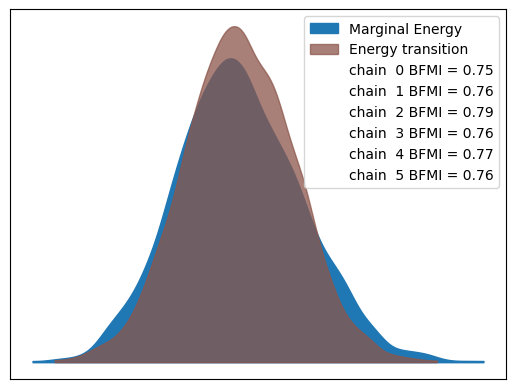

In [129]:
az.plot_energy(idata)

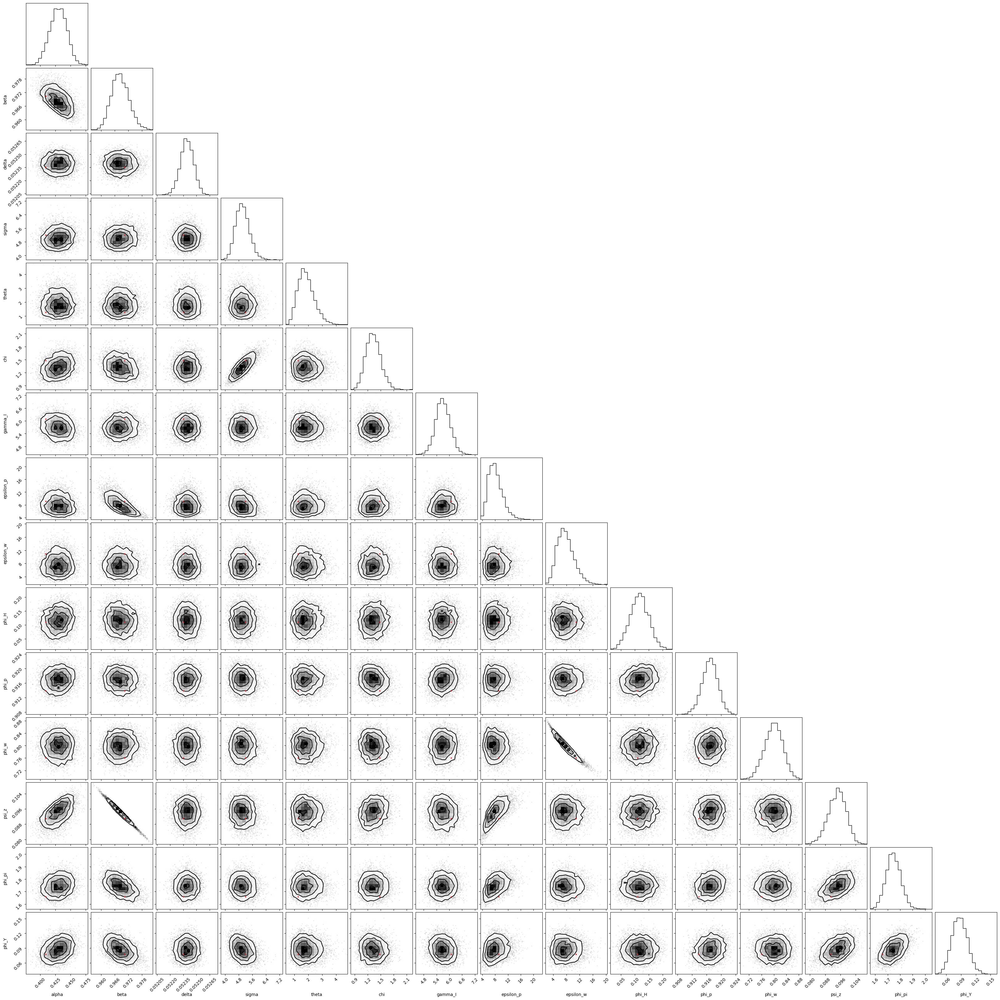

In [130]:
deep_params = [
    "alpha",
    "beta",
    "delta",
    "sigma",
    "theta",
    "chi",
    "gamma_I",
    "epsilon_p",
    "epsilon_w",
    "phi_H",
    "phi_p",
    "phi_w",
    "psi_z",
    "phi_pi",
    "phi_Y",
]
rho_params = [rv.name for rv in pm_mod.free_RVs if rv.name.startswith("rho")]
all_params = [
    rv.name
    for rv in pm_mod.free_RVs
    if "error" not in rv.name and "state_chol" not in rv.name
]
error_params = [rv.name for rv in pm_mod.free_RVs if rv.name.startswith("error")]
state_chol = ["state_chol"]

corner(
    idata,
    var_names=deep_params,
    divergences=True,
    divergences_kwargs={"markersize": 4, "color": "tab:red"},
);

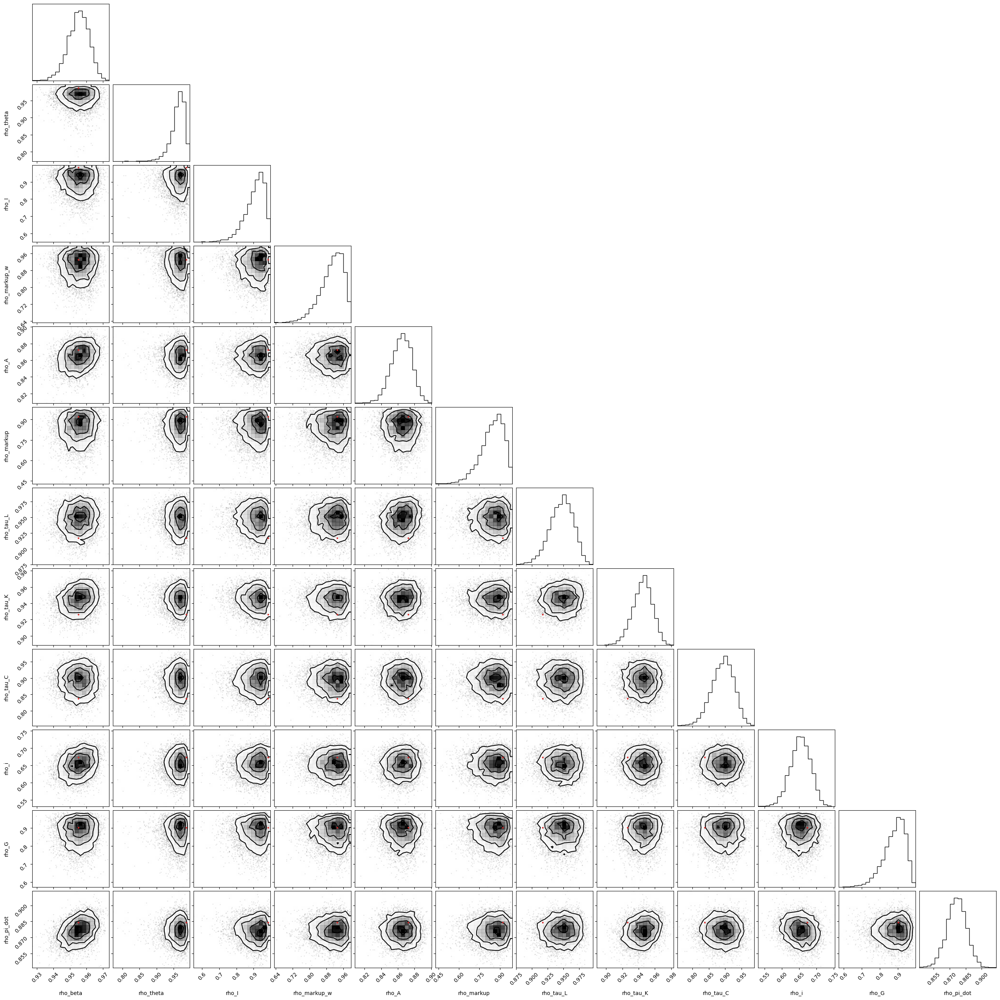

In [132]:
corner(
    idata,
    var_names=rho_params,
    divergences=True,
    divergences_kwargs={"markersize": 4, "color": "tab:red"},
);

In [133]:
def plot_posterior_with_prior(
    idata, var_names, prior_dict, true_values=None, n_cols=5, figsize=None
):
    if true_values is None:
        ref_val = None
    else:
        ref_val = np.r_[
            *[true_values[name].values.ravel() for name in var_names]
        ].tolist()

    if figsize is None:
        figsize = (14, 9)

    fig = plt.figure(figsize=figsize, dpi=144)
    gs, locs = gp.prepare_gridspec_figure(
        n_cols=n_cols, n_plots=len(var_names), figure=fig
    )
    [fig.add_subplot(gs[loc]) for loc in locs]

    axes = az.plot_posterior(
        idata, var_names=var_names, ref_val=ref_val, ax=np.array(fig.axes)
    )
    for axis in axes.ravel():
        var_name, *coords = axis.get_title().split("\n")

        if var_name in prior_dict:
            prior_dict[var_name].plot_pdf(ax=axis, legend=False, color="tab:orange")
    fig.tight_layout()
    plt.show()

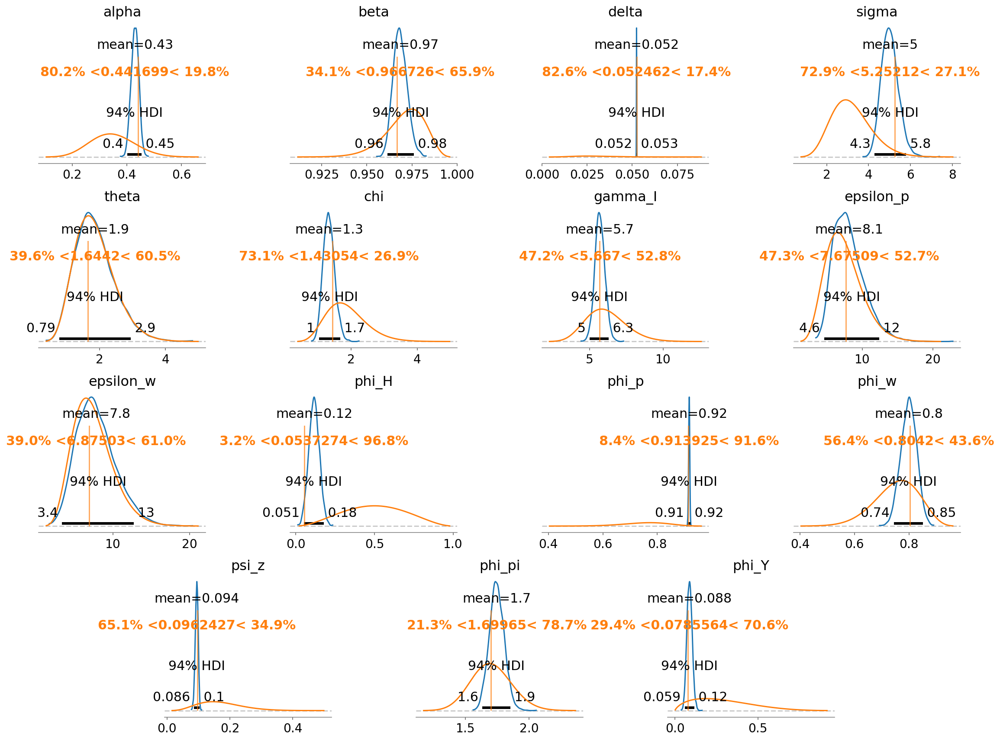

In [134]:
plot_posterior_with_prior(
    idata, deep_params, all_priors, true_values=true_params, n_cols=4, figsize=(16, 12)
)

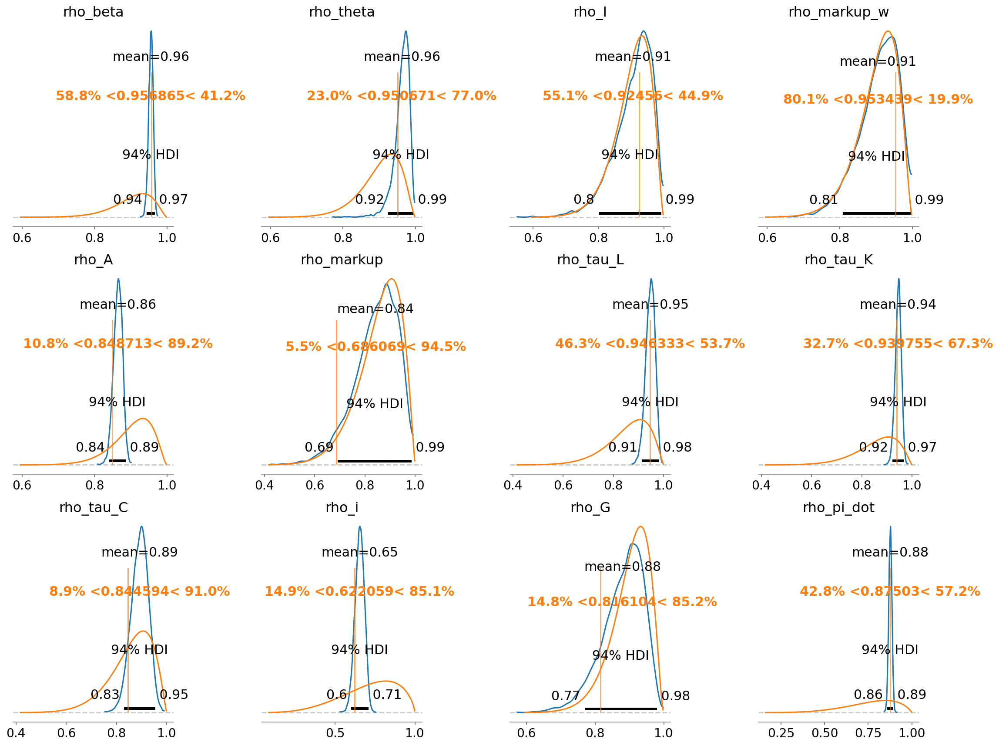

In [135]:
plot_posterior_with_prior(
    idata, rho_params, all_priors, true_values=true_params, n_cols=4, figsize=(16, 12)
)

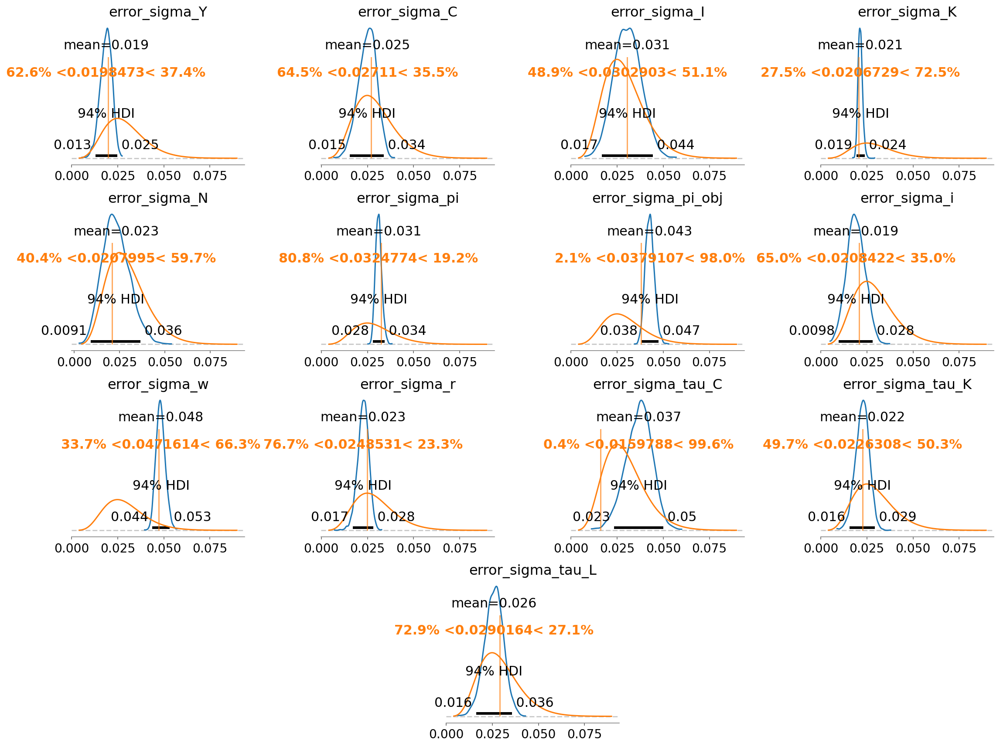

In [136]:
plot_posterior_with_prior(
    idata, error_params, all_priors, true_values=true_params, n_cols=4, figsize=(16, 12)
)

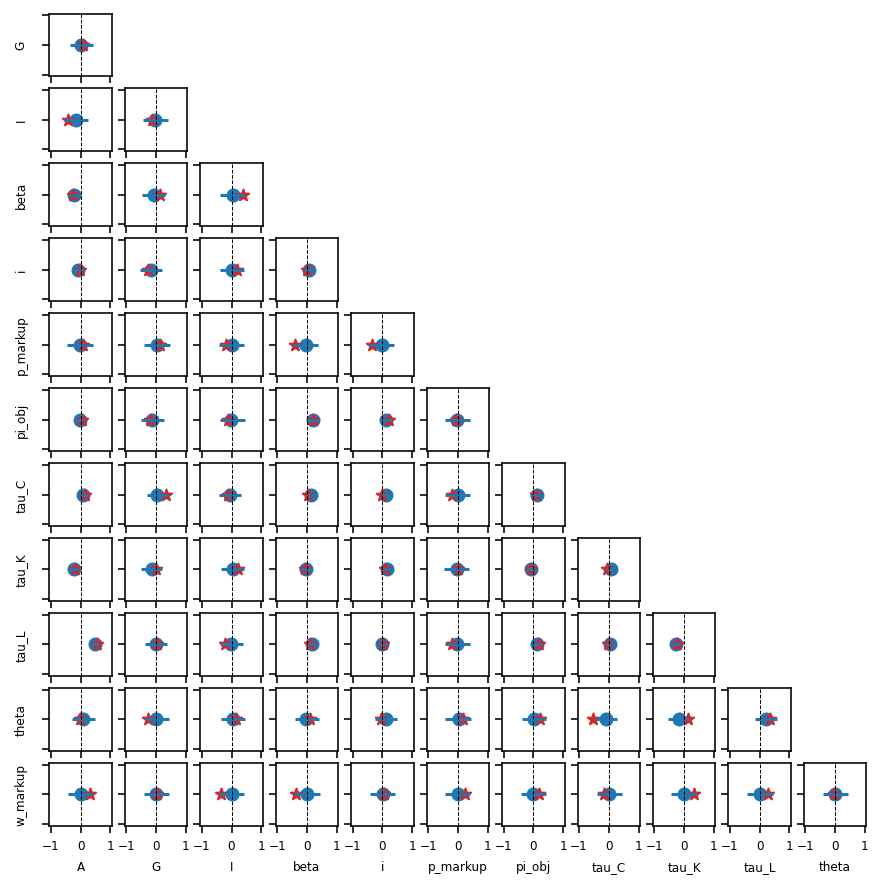

In [137]:
from itertools import product

n_shocks = ss_mod.k_posdef

fig, ax = plt.subplots(
    n_shocks,
    n_shocks,
    figsize=(8, 8),
    dpi=144,
    subplot_kw={"aspect": "equal"},
    sharex=True,
    sharey=True,
)

true_corr = true_params.state_chol_corr.values
mu = idata.posterior.state_chol_corr.mean(dim=["chain", "draw"])
hdi = az.hdi(idata.posterior.state_chol_corr).state_chol_corr
ax[0, 0].set(xlim=(-1.05, 1.05), ylim=(-1.05, 1.05))

for i, j in product(range(n_shocks), range(n_shocks)):
    axis = ax[i, j]
    if i <= j:
        axis.set_visible(False)
        continue
    y_var = mod.shocks[i].base_name
    x_var = mod.shocks[j].base_name
    axis.scatter(mu.values[i, j], 0)
    axis.scatter(true_corr[i, j], 0, marker="*", color="tab:red")

    axis.hlines(0, *hdi.values[i, j])
    axis.axvline(0, ls="--", c="k", lw=0.5)

    axis.set_ylabel(y_var.replace("epsilon_", "") if j == 0 else "", fontsize=6)
    axis.set_xlabel(
        x_var.replace("epsilon_", "") if i == (n_shocks - 1) else "", fontsize=6
    )
    axis.set_yticklabels([])
    axis.tick_params(axis="x", labelsize=6)

plt.show()

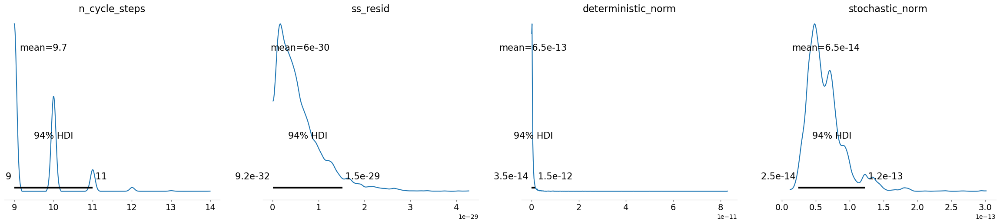

In [138]:
az.plot_posterior(
    idata,
    var_names=["n_cycle_steps", "ss_resid", "deterministic_norm", "stochastic_norm"],
);

In [139]:
cond_post = ss_mod.sample_conditional_posterior(idata)

/Users/jessegrabowski/mambaforge/envs/geconpy-dev/lib/python3.12/site-packages/pytensor/link/jax/linker.py:27: UserWarning: The RandomType SharedVariables [RNG(<Generator(PCG64) at 0x728F1A7760>), RNG(<Generator(PCG64) at 0x728F1A7680>), RNG(<Generator(PCG64) at 0x728F1A75A0>), RNG(<Generator(PCG64) at 0x728F1A74C0>), RNG(<Generator(PCG64) at 0x728F1A73E0>), RNG(<Generator(PCG64) at 0x72D1C53220>)] will not be used in the compiled JAX graph. Instead a copy will be used.
  warnings.warn(
Sampling: [filtered_posterior, filtered_posterior_observed, predicted_posterior, predicted_posterior_observed, smoothed_posterior, smoothed_posterior_observed]


Output()

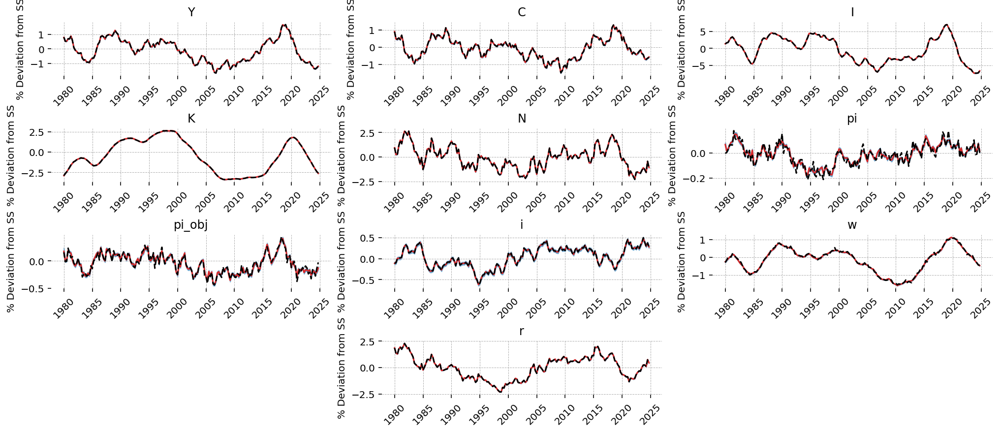

In [140]:
gp.plot_kalman_filter(
    cond_post,
    data,
    kalman_output="smoothed",
    n_cols=3,
    vars_to_plot=[x for x in ss_mod.observed_states if not x.startswith("tau")],
);

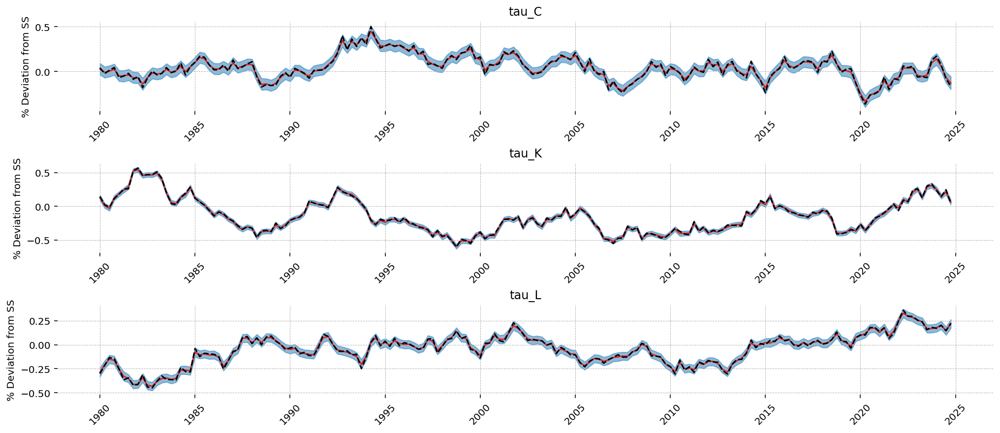

In [141]:
gp.plot_kalman_filter(
    cond_post,
    data,
    kalman_output="smoothed",
    n_cols=1,
    vars_to_plot=[x for x in ss_mod.observed_states if x.startswith("tau")],
);

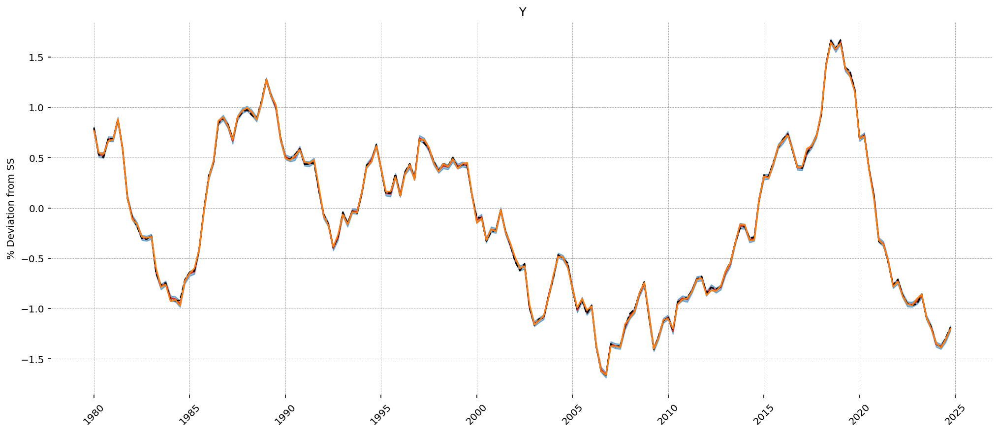

In [142]:
fig = gp.plot_kalman_filter(
    cond_post, data, kalman_output="smoothed", n_cols=1, vars_to_plot=["Y"]
)
ax = fig.axes[0]
ax.plot(latent_data.index, latent_data["Y"], color="tab:orange")

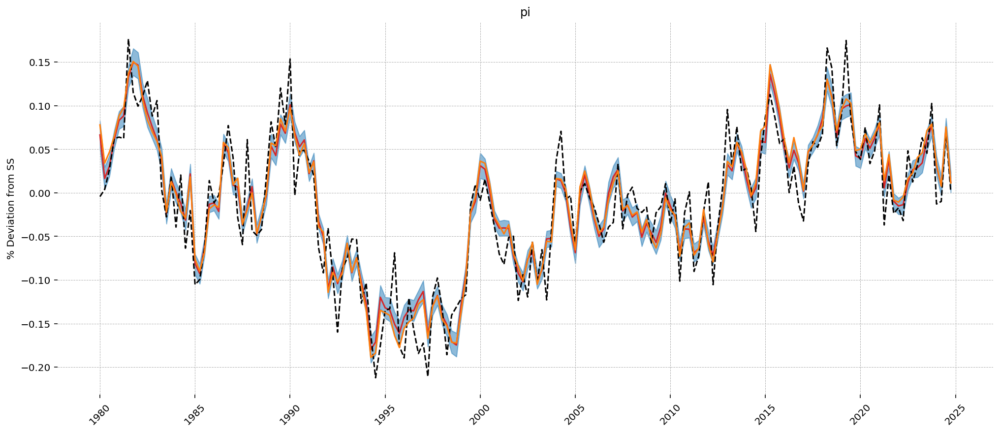

In [143]:
fig = gp.plot_kalman_filter(
    cond_post, data, kalman_output="smoothed", n_cols=1, vars_to_plot=["pi"]
)
ax = fig.axes[0]
ax.plot(latent_data.index, latent_data["pi"], color="tab:orange")

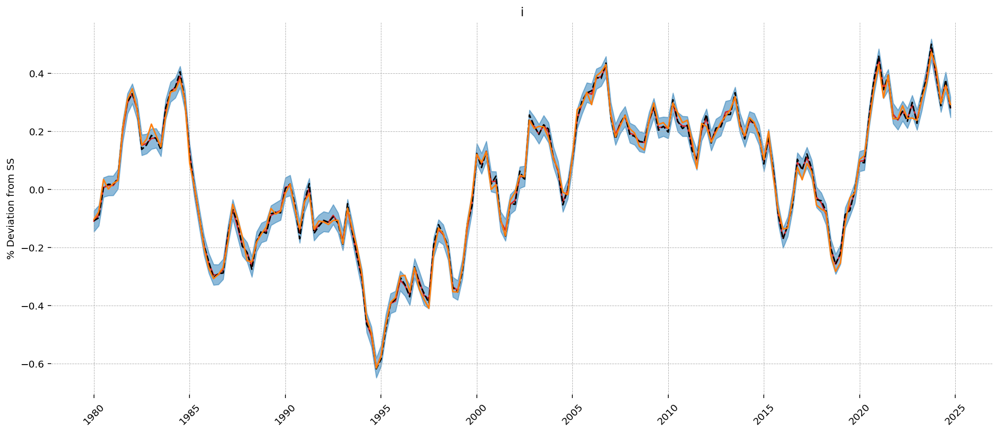

In [144]:
fig = gp.plot_kalman_filter(
    cond_post, data, kalman_output="smoothed", n_cols=1, vars_to_plot=["i"]
)
ax = fig.axes[0]
ax.plot(latent_data.index, latent_data["i"], color="tab:orange")

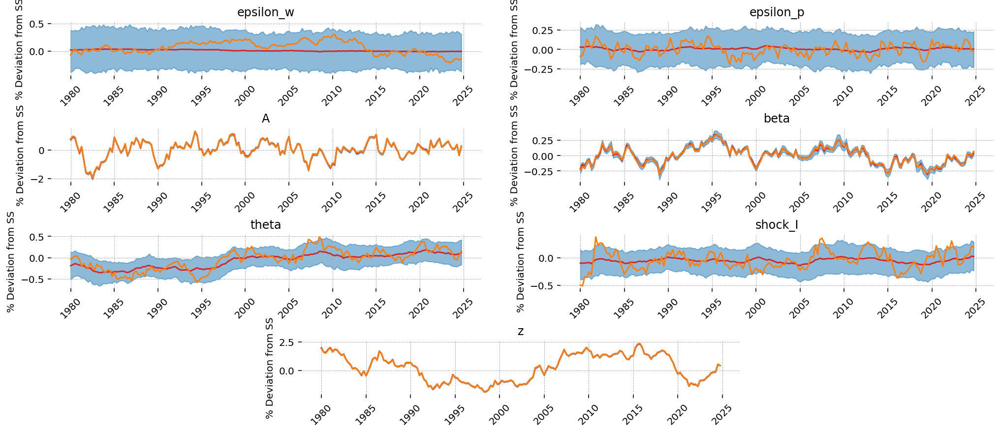

In [145]:
fig = gp.plot_kalman_filter(
    cond_post,
    data,
    kalman_output="smoothed",
    n_cols=2,
    vars_to_plot=["epsilon_w", "epsilon_p", "A", "beta", "theta", "shock_I", "z"],
)
for axis in fig.axes:
    var = axis.get_title()
    axis.plot(latent_data.index, latent_data[var], color="tab:orange")